In [2]:
import numpy as np
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

from xgboost import XGBClassifier



In [3]:
# 1. Tải dữ liệu
X_train = np.load('X_train.npy')
X_test = np.load('X_test.npy')
y_train = np.load('y_train.npy')
y_test = np.load('y_test.npy')

In [5]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
# --- 2. XGBOOST ---
# use_label_encoder=False và eval_metric='logloss' để tránh cảnh báo ở bản mới
xgb_model = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')

param_grid_xgb = {
    # Số lượng cây và tốc độ học
    'n_estimators': [100, 200, 300],
    'learning_rate': [0.01, 0.05, 0.1],
    
    # Độ sâu và trọng số tối thiểu (quan trọng để tỉa cành)
    'max_depth': [3, 4, 5, 6],
    'min_child_weight': [1, 3, 5], # Tăng lên để tránh overfitting
    
    # Ngẫu nhiên hóa (Stochastic features) - Giống Random Forest
    'subsample': [0.8, 1.0],        # Tỉ lệ mẫu hàng
    'colsample_bytree': [0.8, 1.0], # Tỉ lệ cột (feature) mỗi cây
    
    # Tham số đặc trưng của XGBoost: Gamma (Lagrangian multiplier)
    # Giá trị này càng lớn thì mô hình càng "bảo thủ", khó chia nhánh hơn
    'gamma': [0, 0.1, 0.2],
    
    # Điều chuẩn (Regularization) - Rất tốt cho dữ liệu y tế nhỏ
    'reg_alpha': [0, 0.01, 0.1], # L1 Regularization (Lasso)
    'reg_lambda': [1, 1.5, 2]    # L2 Regularization (Ridge)
}

print("Đang tối ưu hóa XGBoost (Có thể hơi lâu)...")
# Vì lưới XGBoost này khá lớn (nhiều tổ hợp), n_jobs=-1 sẽ tận dụng hết CPU của bạn
grid_xgb = GridSearchCV(xgb_model, param_grid_xgb, cv=5, scoring='accuracy', n_jobs=-1)
grid_xgb.fit(X_train, y_train)

print("XGBoost Best Params:", grid_xgb.best_params_)
print(f"XGBoost Best Score: {grid_xgb.best_score_:.4f}")

Đang tối ưu hóa XGBoost (Có thể hơi lâu)...


/opt/anaconda3/lib/python3.13/site-packages/xgboost/training.py:199: UserWarning: [15:14:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.13/site-packages/xgboost/training.py:199: UserWarning: [15:14:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.13/site-packages/xgboost/training.py:199: UserWarning: [15:14:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/opt/anaconda3/lib/python3.13/site-packages/xgboost/training.py:199: UserWarning: [15:14:13] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i

XGBoost Best Params: {'colsample_bytree': 0.8, 'gamma': 0, 'learning_rate': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 300, 'reg_alpha': 0, 'reg_lambda': 1, 'subsample': 0.8}
XGBoost Best Score: 0.9546


[15:20:17] WARNING: /Users/runner/work/xgboost/xgboost/src/learner.cc:790: 
Parameters: { "use_label_encoder" } are not used.



In [6]:
best_model_xgb = grid_xgb.best_estimator_
# Fit the best model on the training data

model_name = 'XGBoost'
y_pred_xgb = best_model_xgb.predict(X_test)

acc = accuracy_score(y_test, y_pred_xgb)
print(f"\nĐộ chính xác (Accuracy) của {model_name}: {acc*100:.2f}%")
print("-" * 30)
print("Báo cáo chi tiết (Precision, Recall, F1-Score):")
print(classification_report(y_test, y_pred_xgb))
print("-" * 30)
print(f'F1_Score: {classification_report(y_test, y_pred_xgb, output_dict=True)["weighted avg"]["f1-score"]:.4f}')
print(f'Accuracy: {classification_report(y_test, y_pred_xgb, output_dict=True)["accuracy"]:.4f}')


Độ chính xác (Accuracy) của GradientBoost: 96.43%
------------------------------
Báo cáo chi tiết (Precision, Recall, F1-Score):
              precision    recall  f1-score   support

           0       1.00      0.96      0.98        52
           1       0.67      1.00      0.80         4

    accuracy                           0.96        56
   macro avg       0.83      0.98      0.89        56
weighted avg       0.98      0.96      0.97        56

------------------------------
F1_Score: 0.9675
Accuracy: 0.9643


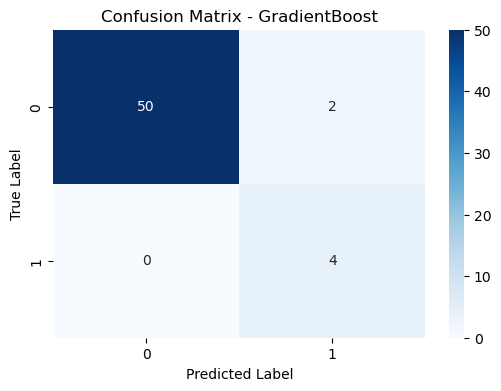

In [8]:
# 5. Vẽ Confusion Matrix (Tùy chọn để làm đẹp báo cáo)
cm = confusion_matrix(y_test, y_pred_xgb)
plt.figure(figsize=(6,4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title(f'Confusion Matrix - {model_name}')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()